<a href="https://colab.research.google.com/github/MayerT1/Prep_GEDI/blob/main/GEDI_L1B_Target_fetch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install earthaccess harmony-py hvplot folium geopandas geoviews

In [2]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [3]:
import os

# Define the base project folder and subdirectories
base_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project'
subdirs = [
    'target_data',
    'GEDI_target',
    'data',
    'models',
    'scripts',
    'notebooks',
    'config',
    'results'
]

# Create each subdirectory
for subdir in subdirs:
    path = os.path.join(base_dir, subdir)
    os.makedirs(path, exist_ok=True)
    print(f"Created: {path}")


Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/target_data
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/data
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/models
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/scripts
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/notebooks
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/config
Created: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/results


In [4]:
!pwd

/content


In [5]:
%cd /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project

/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project


Make a new folder to work in and change directory to that location

In [ ]:
# !mkdir Module_2_GEDI_L2b

# !mkdir Module_2_GEDI_L2b/SPB_AOI
# !mkdir Module_2_GEDI_L2b/Prescribed_Burn_AOI
# !mkdir Module_2_GEDI_L2b/Sewanee_Domain
# !mkdir Module_2_GEDI_L2b/PaintRock_AOI

Change directory to that new folder

In [ ]:
# %cd /content/Module_2_GEDI_L2b

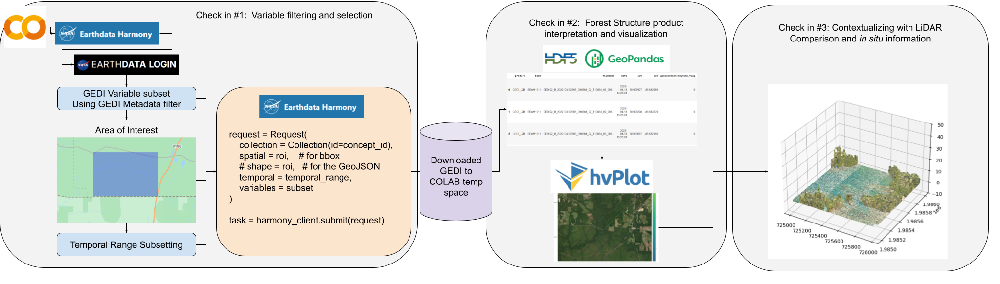

Link to editable workflow (to be removed at the end) https://docs.google.com/drawings/d/1q49Oa-y9W5X25_Qijg0IuSczzcVrcOX5mVfiyIO_UmE/edit

Load the needed packages

In [15]:

from harmony import BBox, Client, Collection, Request, CapabilitiesRequest
import h5py
from datetime import datetime
import json
import earthaccess
import geopandas as gp
import pandas as pd
import numpy as np
import os
from IPython.display import JSON
from shapely.geometry import Point
import hvplot.pandas
import folium
from folium import GeoJson
from IPython.display import display, HTML
import requests
from io import StringIO
from datetime import datetime
import seaborn as sns
from matplotlib import cm, colors
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable, get_cmap
import textwrap
from mpl_toolkits.mplot3d import Axes3D
# gv.extension('bokeh', 'matplotlib')
from holoviews import opts
import shapely
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.colors as colors

os.chdir('../../')

## Authenticate

Pause here and set up your arorund and have your username and password ready for this next section. See the [EarthData Login](https://urs.earthdata.nasa.gov/) if you dont have an account yet.

`earthaccess.login()` is used here to access NASA Earthdata Login (EDL) credentials stored in a .netrc file and allows users to type their credentials and persist them to a .netrc file if one does not exist.

In [16]:
auth = earthaccess.login(persist=True)
# auth.token

Enter your Earthdata Login username: tjm0042
Enter your Earthdata password: ··········


To access data through Harmony service, we need to create a Harmony Client object using either your EDL token or your Earthdata Login credentials. Below, `username` and `password` are directly provided to `Client` function. See [here](https://github.com/nasa/harmony-py/blob/main/examples/intro_tutorial.ipynb) for other options you can create Harmony Client object.

In [17]:
harmony_client = Client(auth=(auth.username, auth.password))

# Visualize our Areas of intres (AOI)

Add relivant biophysical and forest informaiton regarind these sites see  the folder here with the docs to support this: https://drive.google.com/drive/folders/1WvBSUIHy6I05j8s1ZZRarho5qnG2wdnb

In [18]:
# Bring in aois
geojson_urls = {
    # "SPB_AOI": "https://raw.githubusercontent.com/SERVIR/GEDI_Earthhub_ARSET_Training/main/AOIs/SPB_AOI.geojson",
    # "Prescribed_Burn_AOI": "https://raw.githubusercontent.com/SERVIR/GEDI_Earthhub_ARSET_Training/main/AOIs/prescribed_burn_aoi.geojson",
    "Sewanee_Domain": "https://raw.githubusercontent.com/MayerT1/Prep_GEDI/main/AOI/Sewanee_DL_project_bounds.geojson",
    # "PaintRockAOI": "https://raw.githubusercontent.com/SERVIR/GEDI_Earthhub_ARSET_Training/main/AOIs/PaintRockAOI.geojson"
}

In [19]:
# Load GeoJSONs into GeoDataFrames and store map HTML
geojson_gdfs = {}
maps_html = []

def create_map_and_gdf(name, url):
    # Get GeoJSON from URL
    geojson_data = requests.get(url).json()

    # Create GeoDataFrame
    gdf = gp.GeoDataFrame.from_features(geojson_data["features"])
    geojson_gdfs[name] = gdf

    # Determine map center
    coords = geojson_data['features'][0]['geometry']['coordinates']
    geom_type = geojson_data['features'][0]['geometry']['type']

    if geom_type == "Polygon":
        coords = coords[0]
    elif geom_type == "MultiPolygon":
        coords = coords[0][0]
    else:
        raise ValueError(f"Unsupported geometry type: {geom_type}")

    lat = sum(pt[1] for pt in coords) / len(coords)
    lon = sum(pt[0] for pt in coords) / len(coords)

    # Create map
    fmap = folium.Map(location=[lat, lon], zoom_start=13, tiles="OpenStreetMap")
    folium.GeoJson(geojson_data, name=name).add_to(fmap)

    # Return rendered HTML
    return fmap._repr_html_()

# Generate maps and GeoDataFrames
for name, url in geojson_urls.items():
    html_map = create_map_and_gdf(name, url)
    maps_html.append(html_map)


In [20]:
# Display maps side by side
html = f"""
<div style="display: flex; flex-wrap: wrap;">
    {''.join([f'<div style="flex: 1; min-width: 400px; margin: 5px;">{m}</div>' for m in maps_html])}
</div>
"""
display(HTML(html))

In [22]:
##Pull out the geopanda dataframes
# SPB_AOI = geojson_gdfs["SPB_AOI"]
# Prescribed_Burn_AOI = geojson_gdfs["Prescribed_Burn_AOI"]
Sewanee_Domain = geojson_gdfs["Sewanee_Domain"]
# PaintRock_AOI = geojson_gdfs["PaintRockAOI"]

In [23]:
# Store all bbox objects in a dictionary for later use
bbox_dict = {}

for name, url in geojson_urls.items():
    gdf = gp.read_file(url)
    minx, miny, maxx, maxy = gdf.total_bounds
    bbox = BBox(minx, miny, maxx, maxy)
    bbox_dict[f"{name}_roi"] = bbox

bbox_dict


{'Sewanee_Domain_roi': BBox: West:-85.98985851794494, South:35.12704695073614, East:-85.85713664512146, North:35.23574346765027}

## Get the GEDI Collections Harmony Capabilities

First lets investigate what capabilites Harmony has to request data. Using hte short name `'GEDI02_B'`
('GEDI02_A', 'GEDI02_B', 'GEDI01_B')

view informaiton such as `conceptId` such as variable subsetting, bounding box subsetting, shapefile subsetting, concatenation and reprojection, etc.

products of intrest: https://docs.google.com/spreadsheets/d/1Uvls3Oxn_jSmTyaSoWadQrS8tZSWyUGYai7etUoALLc/edit?gid=0#gid=0

In [21]:
capabilities = harmony_client.submit(CapabilitiesRequest(short_name='GEDI01_B'))
print(json.dumps(capabilities, indent=2))

{
  "conceptId": "C2142749196-LPCLOUD",
  "shortName": "GEDI01_B",
  "variableSubset": true,
  "bboxSubset": true,
  "shapeSubset": true,
  "temporalSubset": true,
  "concatenate": false,
  "reproject": false,
  "outputFormats": [
    "application/x-hdf"
  ],
  "services": [
    {
      "name": "sds/trajectory-subsetter",
      "href": "https://cmr.earthdata.nasa.gov/search/concepts/S2836723123-XYZ_PROV",
      "capabilities": {
        "subsetting": {
          "temporal": true,
          "bbox": true,
          "shape": true,
          "variable": true
        },
        "output_formats": [
          "application/x-hdf"
        ]
      }
    }
  ],
  "variables": [
    {
      "name": "/BEAM0000/all_samples_sum",
      "href": "https://cmr.earthdata.nasa.gov/search/concepts/V2809406098-LPCLOUD"
    },
    {
      "name": "/BEAM0000/ancillary/master_time_epoch",
      "href": "https://cmr.earthdata.nasa.gov/search/concepts/V2809406212-LPCLOUD"
    },
    {
      "name": "/BEAM0000/anc

## Create a Harmony Request

There are several parameters that can be used for the Harmony request. See [the documentation](https://harmony-py.readthedocs.io/en/latest/) and [the introductory Harmony tutorial ](https://github.com/nasa/harmony-py/blob/main/examples/intro_tutorial.ipynb) for more details.



Harmony provides access to services that can transform data from NASA's [Earth Observing Systems Data and Information System (EOSDIS)](https://www.earthdata.nasa.gov/eosdis) Distributed Active Archive Centers (DAAC). [`harmony-py`](https://github.com/nasa/harmony-py) Python package is the recommended way of interacting with Harmony service. This notebook shows how to query and access customized [NASA's LP DAAC](https://lpdaac.usgs.gov/)  GEDI data outputs using [NASA's Harmony Services](https://harmony.earthdata.nasa.gov/).


### GEDI Collection Concept ID

`collection` is a Required parameter. The concept ID, which is the NASA EOSDIS collection ID provided in the Common Metadata Repository [(CMR)](https://cmr.earthdata.nasa.gov/search/site/docs/search/api.html) metadata **OR** Product short name (e.g. 'C2142776747-LPCLOUD') can be provided to search for collections.

Below, `concept_id` is saved to a variable.  

In [24]:
print(capabilities['shortName'], ',', capabilities['conceptId'])

concept_id = capabilities['conceptId']
print("concept_id:", concept_id)

GEDI01_B , C2142749196-LPCLOUD
concept_id: C2142749196-LPCLOUD


### GEDI Variable Subset

Take time to explore GEDI variables of importance via the [GEDI l2b dictionary](https://lpdaac.usgs.gov/documents/980/gedi_l2b_dictionary_P003_v2.html)

In [25]:
#See the append_field.txt which hasd a long dictionary of the fields and products of GEDI
#This ictionary will be used to subset our variables of intrest
#Notice this includes'GEDI01_B','GEDI02_A', and 'GEDI02_B'

append_url = "https://raw.githubusercontent.com/MayerT1/Prep_GEDI/main/append_field.txt"
append_text = requests.get(append_url).text

start_index = append_text.find("{")
end_index = append_text.rfind("}") + 1
dict_str = append_text[start_index:end_index]

append_dict = eval(dict_str)

In [26]:
#Display the dictionary we will use to subset later
append_dict

{'GEDI_L1B': ['geolocation/altitude_instrument',
  'geolocation/local_beam_elevation',
  'tx_sample_start_index',
  'nsemean_odd',
  'ancillary/master_time_epoch',
  'noise_stddev_corrected',
  'tx_pulseflag',
  'geolocation/longitude_bin0_error',
  'selection_stretchers_x',
  'nsemean_even',
  'geolocation/latitude_instrument',
  'geolocation/digital_elevation_model',
  'geolocation/longitude_instrument_error',
  'geolocation/longitude_lastbin_error',
  'tx_egsigma',
  'geolocation/neutat_delay_total_bin0',
  'rx_energy',
  'master_frac',
  'rx_sample_count',
  'rxwaveform',
  'tx_gloc',
  'ancillary/mean_samples',
  'geolocation/longitude_instrument',
  'tx_eggamma_error',
  'rx_offset',
  'tx_egbias_error',
  'geolocation/bounce_time_offset_lastbin',
  'all_samples_sum',
  'geophys_corr/tide_load',
  'geolocation/solar_azimuth',
  'geolocation/mean_sea_surface',
  'geolocation/neutat_delay_total_lastbin',
  'th_left_used',
  'rx_sample_start_index',
  'geophys_corr/tide_ocean',
  'g

In [27]:
# print only the dictionary fo avaible GEDI 2 B products to explore
gedi_l2b = append_dict.get('GEDI_L1B', {})

# Step 4: Print items under 'GEDI_L2B'
print("Items under 'GEDI_L1B':")
for item in gedi_l2b:
    print(item)

Items under 'GEDI_L1B':
geolocation/altitude_instrument
geolocation/local_beam_elevation
tx_sample_start_index
nsemean_odd
ancillary/master_time_epoch
noise_stddev_corrected
tx_pulseflag
geolocation/longitude_bin0_error
selection_stretchers_x
nsemean_even
geolocation/latitude_instrument
geolocation/digital_elevation_model
geolocation/longitude_instrument_error
geolocation/longitude_lastbin_error
tx_egsigma
geolocation/neutat_delay_total_bin0
rx_energy
master_frac
rx_sample_count
rxwaveform
tx_gloc
ancillary/mean_samples
geolocation/longitude_instrument
tx_eggamma_error
rx_offset
tx_egbias_error
geolocation/bounce_time_offset_lastbin
all_samples_sum
geophys_corr/tide_load
geolocation/solar_azimuth
geolocation/mean_sea_surface
geolocation/neutat_delay_total_lastbin
th_left_used
rx_sample_start_index
geophys_corr/tide_ocean
geophys_corr/tide_ocean_pole
tx_eggamma
geophys_corr/tide_pole
tx_sample_count
geolocation/surface_type
geolocation/neutat_delay_derivative_bin0
geolocation/digital_el

Select your variables of intrest

In [28]:
#Selecting the 'GEDI02_B' of intrest to then be downloaded
#subset_L2B = ['geolocation/lat_lowestmode', 'geolocation/lon_lowestmode', 'geolocation/degrade_flag', 'geolocation/digital_elevation_model','geolocation/elev_lowestmode','geolocation/elev_highestreturn','l2b_quality_flag','rh100','fhd_normal','cover','cover_z','pai','pai_z','pavd_z','rhov','omega','land_cover_data/pft_class']


# #Selecting the 'GEDI02_B' of intrest to then be downloaded
# subset_L2B = ['geolocation/lat_lowestmode', 'geolocation/lon_lowestmode', 'geolocation/degrade_flag', 'geolocation/digital_elevation_model','geolocation/elev_lowestmode','geolocation/elev_highestreturn','l2b_quality_flag','rh100','fhd_normal','pai'] #'cover','cover_z','pai','pai_z','pavd_z','rhov','omega','land_cover_data/pft_class']


# subset_L2B =  ['geolocation/lat_lowestmode','geolocation/lon_lowestmode','geolocation/solar_elevation','geolocation/local_beam_elevation','selected_l2a_algorithm','geolocation/degrade_flag','l2b_quality_flag','geolocation/digital_elevation_model','geolocation/elev_lowestmode','geolocation/elev_highestreturn', 'rh100','num_detectedmodes', 'sensitivity','land_cover_data/leaf_off_flag','/geolocation/solar_elevation','pgap_theta_z', 'pai', 'pai_z', 'fhd_normal', 'pavd_z', 'cover','cover_z','pgap_theta','pgap_theta_error','rhov','rhov_error','rhog', 'rhog_error']


subset_L2B =['geolocation/latitude_bin0','geolocation/longitude_bin0','shot_number','geolocation/degrade','stale_return_flag','geolocation/elevation_bin0','rxwaveform','rx_sample_count','rx_sample_start_index','rx_energy', 'geolocation/solar_elevation', 'geolocation/digital_elevation_model']
# subset_L2B = ['geolocation/latitude_bin0','geolocation/longitude_bin0','shot_number','geolocation/degrade','stale_return_flag','geolocation/elevation_bin0','rxwaveform', 'rx_energy', 'geolocation/solar_elevation', 'geolocation/digital_elevation_model'] #'degrade'

In [29]:
subset_L2B

['geolocation/latitude_bin0',
 'geolocation/longitude_bin0',
 'shot_number',
 'geolocation/degrade',
 'stale_return_flag',
 'geolocation/elevation_bin0',
 'rxwaveform',
 'rx_sample_count',
 'rx_sample_start_index',
 'rx_energy',
 'geolocation/solar_elevation',
 'geolocation/digital_elevation_model']

In [30]:
### filter those varibales ofintrest out of the larger list
selected_L2B = []
for s in subset_L2B:
    my_var = [v for v in gedi_l2b if v.endswith(f'{s}')]
    if len(my_var) == 1:
        selected_L2B.append(my_var[0])

    elif len(my_var) > 1:
        my_var = [v for v in my_var if v.startswith(f'{s}')]

        for l in my_var:
            if l not in selected_L2B:
                selected_L2B.append(l)

selected_L2B

['geolocation/latitude_bin0',
 'geolocation/longitude_bin0',
 'shot_number',
 'geolocation/degrade',
 'stale_return_flag',
 'geolocation/elevation_bin0',
 'rxwaveform',
 'rx_sample_count',
 'rx_sample_start_index',
 'rx_energy',
 'geolocation/solar_elevation',
 'geolocation/digital_elevation_model']

Select the subset of your desired beams. For instance, you can only select Full Power beams ('BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011').

In [31]:
#Selecting a few beams: ['BEAM0000', 'BEAM0001', 'BEAM0010', 'BEAM0011', 'BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011']
beams = ['BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011']


In [32]:
#Append our beams of intrest to our variables of intrest
#the subset list will then be used throughout
subset = []
for b in beams:
    beam_subset = [f'/{b}/{layer}' for layer in selected_L2B]
    [subset.append(i) for i in beam_subset]
subset

['/BEAM0101/geolocation/latitude_bin0',
 '/BEAM0101/geolocation/longitude_bin0',
 '/BEAM0101/shot_number',
 '/BEAM0101/geolocation/degrade',
 '/BEAM0101/stale_return_flag',
 '/BEAM0101/geolocation/elevation_bin0',
 '/BEAM0101/rxwaveform',
 '/BEAM0101/rx_sample_count',
 '/BEAM0101/rx_sample_start_index',
 '/BEAM0101/rx_energy',
 '/BEAM0101/geolocation/solar_elevation',
 '/BEAM0101/geolocation/digital_elevation_model',
 '/BEAM0110/geolocation/latitude_bin0',
 '/BEAM0110/geolocation/longitude_bin0',
 '/BEAM0110/shot_number',
 '/BEAM0110/geolocation/degrade',
 '/BEAM0110/stale_return_flag',
 '/BEAM0110/geolocation/elevation_bin0',
 '/BEAM0110/rxwaveform',
 '/BEAM0110/rx_sample_count',
 '/BEAM0110/rx_sample_start_index',
 '/BEAM0110/rx_energy',
 '/BEAM0110/geolocation/solar_elevation',
 '/BEAM0110/geolocation/digital_elevation_model',
 '/BEAM1000/geolocation/latitude_bin0',
 '/BEAM1000/geolocation/longitude_bin0',
 '/BEAM1000/shot_number',
 '/BEAM1000/geolocation/degrade',
 '/BEAM1000/stale

# Create Request Task and download spatially and vairable subseted H5 Files

These code block creates request tasks via harmony and downloads them to the set directories.
The AOI, time period, and subset variables are used to create the the request


In [ ]:
# # Define temporal range
# temporal_range = {'start': datetime(2019, 4, 1),
#                   'stop': datetime(2024, 12, 30)}

In [ ]:
# # Corresponding output directories
# output_dirs = [
#     # '/content/Module_2_GEDI_L2b/SPB_AOI',
#     # '/content/Module_2_GEDI_L2b/Prescribed_Burn_AOI',
#     # '/content/Module_2_GEDI_L2b/PaintRock_AOI',
#     # '/content/Module_2_GEDI_L2b/Sewanee_Domain'
#     '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target'
# ]

In [ ]:
# # Loop through paired spatial ROIs and directories
# for (spatial, out_dir) in zip(bbox_dict.keys(), output_dirs):
#     print(f"\nSubmitting request for: {out_dir}")

#     request = Request(
#         collection=Collection(id=concept_id),
#         spatial=bbox_dict[spatial],  # Use the corresponding BBox from the dictionary
#         temporal=temporal_range,
#         variables=subset
#     )

#     print("Check if the request payload is valid:", request.is_valid())
#     print(request.__dict__)

#     task = harmony_client.submit(request)
#     print(f'Harmony request ID: {task}')

#     print('Processing your Harmony request:')
#     task_json = harmony_client.result_json(task, show_progress=True)

#     results = harmony_client.download_all(task, directory=out_dir, overwrite=True)
#     file_names = [f.result() for f in results]

#     print(f"Download completed for {out_dir}")


dev loop the harmoy api request

In [33]:
# Corresponding output directories
output_dirs = [
    '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target'
]

In [34]:
from datetime import datetime, timedelta
import os
from harmony import BBox, Request, Collection

# --- CONFIG ---
num_chunks = 10
beams = ['BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011']

# Define temporal range
start_date = datetime(2019, 4, 1)
end_date = datetime(2024, 12, 30)
total_days = (end_date - start_date).days
chunk_size = total_days // num_chunks

# Loop through each AOI and its output directory
for (spatial, out_dir) in zip(bbox_dict.keys(), output_dirs):
    print(f"\n🔹 Starting downloads for AOI: {spatial}")

    # Loop through each beam
    for beam in beams:
        print(f"\n➡️ Beam: {beam}")

        # Filter your subset list for the current beam
        subset_beam = [v for v in subset if f"/{beam}/" in v]

        # Make sure we have output folders for this beam
        beam_out_dir = os.path.join(out_dir, beam)
        os.makedirs(beam_out_dir, exist_ok=True)

        # Split time range into N chunks
        for i in range(num_chunks):
            chunk_start = start_date + timedelta(days=i * chunk_size)
            chunk_end = start_date + timedelta(days=(i + 1) * chunk_size)
            if chunk_end > end_date:
                chunk_end = end_date

            temporal_chunk = {'start': chunk_start, 'stop': chunk_end}

            # Create a subfolder per chunk for better organization
            chunk_folder_name = f"{beam}_chunk_{i+1:02d}_{chunk_start.date()}_{chunk_end.date()}"
            chunk_out_dir = os.path.join(beam_out_dir, chunk_folder_name)
            os.makedirs(chunk_out_dir, exist_ok=True)

            print(f"\n🕒 {beam} | Chunk {i+1}/{num_chunks}: {chunk_start.date()} → {chunk_end.date()}")

            try:
                request = Request(
                    collection=Collection(id=concept_id),
                    spatial=bbox_dict[spatial],
                    temporal=temporal_chunk,
                    variables=subset_beam
                )

                if not request.is_valid():
                    print(f"⚠️ Skipping invalid request for {beam} chunk {i+1}")
                    continue

                print(f"Submitting Harmony request for {beam} chunk {i+1}")
                task = harmony_client.submit(request)

                print("⏳ Waiting for Harmony task to complete...")
                task_json = harmony_client.result_json(task, show_progress=True)

                print(f"⬇️ Downloading results to: {chunk_out_dir}")
                results = harmony_client.download_all(task, directory=chunk_out_dir, overwrite=True)

                file_names = [f.result() for f in results]
                print(f"✅ Download completed for {beam} chunk {i+1}")

            except Exception as e:
                print(f"❌ Error with {beam} chunk {i+1}: {e}")



🔹 Starting downloads for AOI: Sewanee_Domain_roi

➡️ Beam: BEAM0101

🕒 BEAM0101 | Chunk 1/10: 2019-04-01 → 2019-10-28
Submitting Harmony request for BEAM0101 chunk 1
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/120514935_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/120514936_GEDI01_B_2019209043943_O03530_03_T03157_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/120514937_GEDI01_B_2019210205202_O03556_02_T00995_02_005_01_V002_subsetted.h5
✅ Download completed for BEAM0101 chunk 1

🕒 BEAM0101 | Chunk 2/10: 2019-10-28 → 2020-05-25
Submitting Harmony request for BEAM0101 chunk 2
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_02_2019-10-28_2020-05-25
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_02_2019-10-28_2020-05-25/120517814_GEDI01_B_2019312044317_O05128_02_T02571_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_02_2019-10-28_2020-05-25/120517815_GEDI01_B_2019337015939_O05514_03_T01887_02_005_01_V002_subsetted.h5
✅ Download completed for BEAM0101 chunk 2

🕒 BEAM0101 | Chunk 3/10: 2020-05-25 → 2020-12-21
Submitting Harmony request for BEAM0101 chunk 3
⏳ Waiting for Harmony task to complete...


 [ Processing:  54% ] |###########################                        | [|]


❌ Error with BEAM0101 chunk 3: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/jobs/3292e168-e3ad-4c09-aa13-bba653fd1264?linktype=https

🕒 BEAM0101 | Chunk 4/10: 2020-12-21 → 2021-07-19
Submitting Harmony request for BEAM0101 chunk 4
❌ Error with BEAM0101 chunk 4: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/C2142749196-LPCLOUD/ogc-api-coverages/1.0.0/collections/parameter_vars/coverage/rangeset

🕒 BEAM0101 | Chunk 5/10: 2021-07-19 → 2022-02-14
Submitting Harmony request for BEAM0101 chunk 5
⏳ Waiting for Harmony task to complete...


❌ Error with BEAM0101 chunk 5: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/jobs/a965aa99-707a-4ae6-a4b3-1015d3159a15?linktype=https

🕒 BEAM0101 | Chunk 6/10: 2022-02-14 → 2022-09-12
Submitting Harmony request for BEAM0101 chunk 6
❌ Error with BEAM0101 chunk 6: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/jobs/5a337f77-8c29-42c0-8dc0-92340ae55c9f

🕒 BEAM0101 | Chunk 7/10: 2022-09-12 → 2023-04-10
Submitting Harmony request for BEAM0101 chunk 7
❌ Error with BEAM0101 chunk 7: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/C2142749196-LPCLOUD/ogc-api-coverages/1.0.0/collections/parameter_vars/coverage/rangeset

🕒 BEAM0101 | Chunk 8/10: 2023-04-10 → 2023-11-06
Submitting Harmony request for BEAM0101 chunk 8
❌ Error with BEAM0101 chunk 8: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/C2142749196-LPCLOUD/ogc-api-coverages/1.0.0/collections/parameter_vars/coverage/rangeset

🕒 BEAM01

❌ Error with BEAM0101 chunk 10: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/jobs/ea99ab7d-2876-4c96-932d-14f3df290b4c?linktype=https

➡️ Beam: BEAM0110

🕒 BEAM0110 | Chunk 1/10: 2019-04-01 → 2019-10-28
Submitting Harmony request for BEAM0110 chunk 1
❌ Error with BEAM0110 chunk 1: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/jobs/a12f57ec-f8b8-41fa-a12c-6a9f93c033ed

🕒 BEAM0110 | Chunk 2/10: 2019-10-28 → 2020-05-25
Submitting Harmony request for BEAM0110 chunk 2
⏳ Waiting for Harmony task to complete...


❌ Error with BEAM0110 chunk 2: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/jobs/ad89db9e-b53f-4d4f-a7f9-66d83f662bbe?linktype=https

🕒 BEAM0110 | Chunk 3/10: 2020-05-25 → 2020-12-21
Submitting Harmony request for BEAM0110 chunk 3
❌ Error with BEAM0110 chunk 3: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/C2142749196-LPCLOUD/ogc-api-coverages/1.0.0/collections/parameter_vars/coverage/rangeset

🕒 BEAM0110 | Chunk 4/10: 2020-12-21 → 2021-07-19
Submitting Harmony request for BEAM0110 chunk 4
❌ Error with BEAM0110 chunk 4: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/jobs/b5e19782-11a7-48d3-b0a2-9d28ff0ee2ff

🕒 BEAM0110 | Chunk 5/10: 2021-07-19 → 2022-02-14
Submitting Harmony request for BEAM0110 chunk 5
❌ Error with BEAM0110 chunk 5: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/jobs/1e97b384-ce95-46ed-b88a-da26da05e38e

🕒 BEAM0110 | Chunk 6/10: 2022-02-14 → 2022-09-12
Submit

 [ Processing:   9% ] |####                                               | [/]


❌ Error with BEAM1000 chunk 1: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/jobs/9f7c23ea-f9d6-41a6-8847-b19254976ecf?linktype=https

🕒 BEAM1000 | Chunk 2/10: 2019-10-28 → 2020-05-25
Submitting Harmony request for BEAM1000 chunk 2
❌ Error with BEAM1000 chunk 2: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/jobs/0b5c7100-41ca-4cd8-902f-50749adb730c

🕒 BEAM1000 | Chunk 3/10: 2020-05-25 → 2020-12-21
Submitting Harmony request for BEAM1000 chunk 3
❌ Error with BEAM1000 chunk 3: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/jobs/25e39824-e318-412a-a6ab-3ed849d0354f

🕒 BEAM1000 | Chunk 4/10: 2020-12-21 → 2021-07-19
Submitting Harmony request for BEAM1000 chunk 4
❌ Error with BEAM1000 chunk 4: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/C2142749196-LPCLOUD/ogc-api-coverages/1.0.0/collections/parameter_vars/coverage/rangeset

🕒 BEAM1000 | Chunk 5/10: 2021-07-19 → 2022-02-14
Submit

 [ Processing:   0% ] |                                                   | [-]


❌ Error with BEAM1000 chunk 5: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/jobs/c834f3cd-6789-4f17-8351-4df5c875e891?linktype=https

🕒 BEAM1000 | Chunk 6/10: 2022-02-14 → 2022-09-12
Submitting Harmony request for BEAM1000 chunk 6
❌ Error with BEAM1000 chunk 6: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/C2142749196-LPCLOUD/ogc-api-coverages/1.0.0/collections/parameter_vars/coverage/rangeset

🕒 BEAM1000 | Chunk 7/10: 2022-09-12 → 2023-04-10
Submitting Harmony request for BEAM1000 chunk 7
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_07_2022-09-12_2023-04-10
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_07_2022-09-12_2023-04-10/120520016_GEDI01_B_2022289120454_O21768_02_T09533_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_07_2022-09-12_2023-04-10/120520018_GEDI01_B_2022352181058_O22749_03_T07426_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_07_2022-09-12_2023-04-10/120520019_GEDI01_B_2022358084911_O22836_02_T06687_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_07_2022-09-12_2023-04-10/120520020_GEDI01_B_2023023204458_O23309_02_T08110_02_005_02_V002_subsetted.h5
✅ Download completed 

 [ Processing:   0% ] |                                                   | [/]

⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_09_2023-11-06_2024-06-03



There is no file to download.

Job status is successful with message: WorkItem warned: sds/trajectory-subsetter:0.3.8: No data found to process.


✅ Download completed for BEAM1000 chunk 9

🕒 BEAM1000 | Chunk 10/10: 2024-06-03 → 2024-12-30
Submitting Harmony request for BEAM1000 chunk 10
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_10_2024-06-03_2024-12-30
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_10_2024-06-03_2024-12-30/120521191_GEDI01_B_2024169103448_O31228_02_T05264_02_006_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_10_2024-06-03_2024-12-30/120521193_GEDI01_B_2024294160731_O33170_03_T08849_02_006_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_10_2024-06-03_2024-12-30/120521192_GEDI01_B_2024206031011_O31797_03_T04733_02_006_03_V002_subsetted.h5
✅ Download completed for BEAM1000 chunk 10

➡️ Beam: BEAM1011

🕒 BEAM1011 | Chunk 1/10: 2019-04-01 → 2019-10-28
Submitting Harmony request for BEAM1011 chunk 1
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_01_2019-04-01_2019-10-28
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_01_2019-04-01_2019-10-28/120522149_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_01_2019-04-01_2019-10-28/120522150_GEDI01_B_2019209043943_O03530_03_T03157_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_01_2019-04-01_2019-10-28/120522148_GEDI01_B_2019122150008_O02186_03_T04733_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_01_2019-04-01_2019-10-28/120522151_GEDI01_B_2019210205202_O03556_02_T00995_02_005_01_V002_subsetted.h5
✅ Download completed 

 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_02_2019-10-28_2020-05-25
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_02_2019-10-28_2020-05-25/120524940_GEDI01_B_2019337015939_O05514_03_T01887_02_005_01_V002_subsetted.h5
✅ Download completed for BEAM1011 chunk 2

🕒 BEAM1011 | Chunk 3/10: 2020-05-25 → 2020-12-21
Submitting Harmony request for BEAM1011 chunk 3
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_03_2020-05-25_2020-12-21
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_03_2020-05-25_2020-12-21/120525637_GEDI01_B_2020196021509_O08987_02_T05264_02_005_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_03_2020-05-25_2020-12-21/120525636_GEDI01_B_2020182144232_O08778_03_T00311_02_005_01_V002_subsetted.h5
✅ Download completed for BEAM1011 chunk 3

🕒 BEAM1011 | Chunk 4/10: 2020-12-21 → 2021-07-19
Submitting Harmony request for BEAM1011 chunk 4
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_04_2020-12-21_2021-07-19
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_04_2020-12-21_2021-07-19/120526426_GEDI01_B_2021135083748_O13719_03_T08849_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_04_2020-12-21_2021-07-19/120526427_GEDI01_B_2021139070445_O13780_03_T06003_02_005_02_V002_subsetted.h5
✅ Download completed for BEAM1011 chunk 4

🕒 BEAM1011 | Chunk 5/10: 2021-07-19 → 2022-02-14
Submitting Harmony request for BEAM1011 chunk 5
⏳ Waiting for Harmony task to complete...


 [ Processing:   9% ] |####                                               | [\]


❌ Error with BEAM1011 chunk 5: 502 Server Error: Bad Gateway for url: https://harmony.earthdata.nasa.gov/jobs/a86c8214-1e3b-4ec4-aa5b-79b864fa8fad?linktype=https

🕒 BEAM1011 | Chunk 6/10: 2022-02-14 → 2022-09-12
Submitting Harmony request for BEAM1011 chunk 6
⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_06_2022-02-14_2022-09-12
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_06_2022-02-14_2022-09-12/120527869_GEDI01_B_2022110105831_O18991_02_T02571_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_06_2022-02-14_2022-09-12/120527868_GEDI01_B_2022068034341_O18335_02_T00995_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_06_2022-02-14_2022-09-12/120527871_GEDI01_B_2022177153027_O20033_03_T01887_02_005_03_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_06_2022-02-14_2022-09-12/120527867_GEDI01_B_2022062130418_O18248_03_T10425_02_005_02_V002_subsetted.h5
✅ Download completed 

 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_07_2022-09-12_2023-04-10
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_07_2022-09-12_2023-04-10/120530843_GEDI01_B_2022289120454_O21768_02_T09533_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_07_2022-09-12_2023-04-10/120530846_GEDI01_B_2022358084911_O22836_02_T06687_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_07_2022-09-12_2023-04-10/120530845_GEDI01_B_2022352181058_O22749_03_T07426_02_005_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_07_2022-09-12_2023-04-10/120530847_GEDI01_B_2023023204458_O23309_02_T08110_02_005_02_V002_subsetted.h5
✅ Download completed 

 [ Processing:   0% ] |                                                   | [/]

⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_09_2023-11-06_2024-06-03



There is no file to download.

Job status is successful with message: WorkItem warned: sds/trajectory-subsetter:0.3.8: No data found to process.


✅ Download completed for BEAM1011 chunk 9

🕒 BEAM1011 | Chunk 10/10: 2024-06-03 → 2024-12-30
Submitting Harmony request for BEAM1011 chunk 10


 [ Processing:   0% ] |                                                   | [/]

⏳ Waiting for Harmony task to complete...


 [ Processing: 100% ] |###################################################| [|]


⬇️ Downloading results to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_10_2024-06-03_2024-12-30
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_10_2024-06-03_2024-12-30/120532369_GEDI01_B_2024169103448_O31228_02_T05264_02_006_02_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_10_2024-06-03_2024-12-30/120532370_GEDI01_B_2024206031011_O31797_03_T04733_02_006_03_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1011/BEAM1011_chunk_10_2024-06-03_2024-12-30/120532371_GEDI01_B_2024294160731_O33170_03_T08849_02_006_02_V002_subsetted.h5
✅ Download completed for BEAM1011 chunk 10


In [35]:
## confirm files are in the right spots
!find /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target

/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/118361193_GEDI02_B_2019138014405_O02426_02_T03841_02_003_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/118361194_GEDI02_B_2019209043943_O03530_03_T03157_02_003_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101/BEAM0101_chunk_01_2019-04-01_2019-10-28/118361195_GEDI02_B_2019210205202_O03556_02_T00995_02_003_01_V002_subsetted.h5
/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM0101

filter list: https://docs.google.com/document/d/1nm0qn_E6_dGM2g5_mu4utRip6VzC0QUF3Z_lmtxP4Ow/edit?tab=t.0

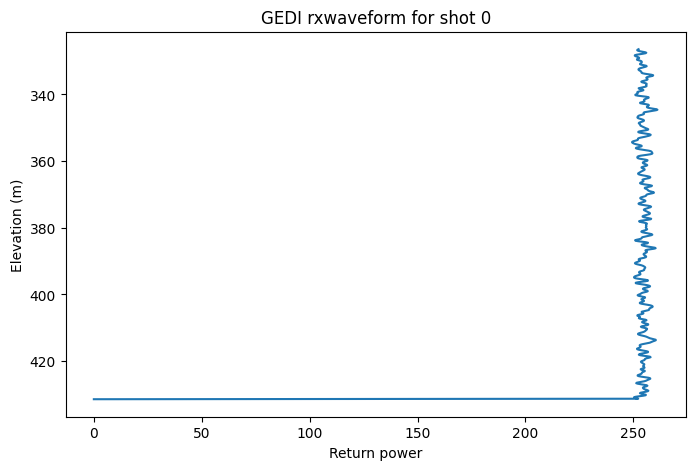

In [38]:
import h5py
import matplotlib.pyplot as plt
import numpy as np

# Path to your full GEDI L1B file
file_path = "/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_10_2024-06-03_2024-12-30/120521192_GEDI01_B_2024206031011_O31797_03_T04733_02_006_03_V002_subsetted.h5"
beam = "BEAM1000"

with h5py.File(file_path, "r") as f:
    grp = f[beam]

    # Full waveform array
    rx = grp['rxwaveform'][:]

    # Indices for each shot
    start_idx = grp['rx_sample_start_index'][:]
    sample_count = grp['rx_sample_count'][:]

    # Elevation info
    elev_bin0 = grp['geolocation/elevation_bin0'][:]
    bin_spacing = 0.15  # default GEDI bin spacing in meters (can be adjusted)

    # Optional: latitude/longitude for reference
    lat = grp['geolocation/latitude_bin0'][:]
    lon = grp['geolocation/longitude_bin0'][:]

# Pick the first shot
i = 0
start = start_idx[i]
count = sample_count[i]

waveform = rx[start:start+count]

# Generate elevation bins for this shot
elev = elev_bin0[i] + np.arange(count) * bin_spacing

# Plot
plt.figure(figsize=(8,5))
plt.plot(waveform, elev)  # waveform power vs elevation
plt.gca().invert_yaxis()  # optional: invert Y to have ground at bottom
plt.xlabel("Return power")
plt.ylabel("Elevation (m)")
plt.title(f"GEDI rxwaveform for shot {i}")
plt.show()


look at one h5 to see th evairbale dtype

In [39]:
import h5py

# Path to a single GEDI L1B file
h5_file = "/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_10_2024-06-03_2024-12-30/120521192_GEDI01_B_2024206031011_O31797_03_T04733_02_006_03_V002_subsetted.h5"

with h5py.File(h5_file, 'r') as f:
    print(f"Contents of {h5_file}:\n")
    for beam in f.keys():
        print(f"Beam: {beam}")
        for group_name, group in f[beam].items():
            print(f"  {group_name}:")
            if isinstance(group, h5py.Dataset):
                print(f"    Dataset: shape={group.shape}, dtype={group.dtype}")
            elif isinstance(group, h5py.Group):
                for ds_name, ds in group.items():
                    print(f"    {ds_name}: shape={ds.shape}, dtype={ds.dtype}")
        print("\n")


Contents of /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/BEAM1000/BEAM1000_chunk_10_2024-06-03_2024-12-30/120521192_GEDI01_B_2024206031011_O31797_03_T04733_02_006_03_V002_subsetted.h5:

Beam: BEAM1000
  delta_time:
    Dataset: shape=(127,), dtype=float64
  geolocation:
    degrade: shape=(127,), dtype=int8
    delta_time: shape=(127,), dtype=float64
    digital_elevation_model: shape=(127,), dtype=float32
    elevation_bin0: shape=(127,), dtype=float64
    latitude_bin0: shape=(127,), dtype=float64
    longitude_bin0: shape=(127,), dtype=float64
    solar_elevation: shape=(127,), dtype=float32
  rx_energy:
    Dataset: shape=(127,), dtype=float64
  rx_sample_count:
    Dataset: shape=(127,), dtype=uint16
  rx_sample_start_index:
    Dataset: shape=(127,), dtype=uint64
  rxwaveform:
    Dataset: shape=(180340,), dtype=float32
  shot_number:
    Dataset: shape=(127,), dtype=uint64
  stale_return_flag:
    Dataset: shape=(127,), dtype=uint8


Beam: METAD

In [40]:
# import os
# import h5py
# import numpy as np
# import pandas as pd

# # Root directory containing BEAM folders
# root_dir = "/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target"

# summary = []

# # Walk through all subdirectories to find .h5 GEDI01 files
# for dirpath, dirnames, filenames in os.walk(root_dir):
#     for file in filenames:
#         if file.endswith(".h5") and "GEDI01" in file:
#             file_path = os.path.join(dirpath, file)
#             try:
#                 with h5py.File(file_path, "r") as f:
#                     # Loop through all beam groups (they start with "BEAM")
#                     for beam in [b for b in f.keys() if b.startswith("BEAM")]:
#                         if "rxwaveform" in f[beam]:
#                             rx = f[beam]["rxwaveform"][:]

#                             if rx.size > 0:
#                                 stats = {
#                                     "file": file_path,
#                                     "beam": beam,
#                                     "shape": rx.shape,
#                                     "count": rx.size,
#                                     "nan_count": np.isnan(rx).sum(),
#                                     "mean": np.nanmean(rx),
#                                     "std": np.nanstd(rx),
#                                     "min": np.nanmin(rx),
#                                     "max": np.nanmax(rx),
#                                 }
#                             else:
#                                 stats = {
#                                     "file": file_path,
#                                     "beam": beam,
#                                     "shape": rx.shape,
#                                     "count": 0,
#                                     "nan_count": 0,
#                                     "mean": np.nan,
#                                     "std": np.nan,
#                                     "min": np.nan,
#                                     "max": np.nan,
#                                 }
#                             summary.append(stats)
#                         else:
#                             summary.append({
#                                 "file": file_path,
#                                 "beam": beam,
#                                 "shape": None,
#                                 "count": 0,
#                                 "nan_count": None,
#                                 "mean": None,
#                                 "std": None,
#                                 "min": None,
#                                 "max": None
#                             })
#             except Exception as e:
#                 print(f"Error reading {file_path}: {e}")

# # Convert to DataFrame for easier viewing
# summary_df = pd.DataFrame(summary)

# # # Save to CSV for inspection
# # csv_path = os.path.join(root_dir, "rxwaveform_summary.csv")
# # summary_df.to_csv(csv_path, index=False)

# # print(f"✅ Summary complete! {len(summary_df)} entries written to:")
# # print(csv_path)

# # Display first few rows
# summary_df.head()


,file,beam,shape,count,nan_count,mean,std,min,max
0,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,BEAM0101,"(350740,)",350740,0,153.462570,112.009407,0.0,1042.444946
1,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,BEAM0101,"(391920,)",391920,0,143.737793,111.796196,0.0,1301.118530
2,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,BEAM0101,"(396180,)",396180,0,106.890533,103.042351,0.0,226.226944
3,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,BEAM0101,"(75260,)",75260,0,164.555832,86.752090,0.0,235.734085
4,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,BEAM0101,"(194540,)",194540,0,180.153580,76.192345,0.0,255.692764


In [ ]:
# import h5py
# import os
# import glob
# import pandas as pd
# import numpy as np
# from geopy.distance import geodesic

# # =========================================
# # CONFIG
# # =========================================

# data_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target'
# output_dir = os.path.join(data_dir, 'filtered_csvs_full')
# os.makedirs(output_dir, exist_ok=True)

# beam_groups = ['BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011']

# variables = [
#     'geolocation/latitude_bin0',
#     'geolocation/longitude_bin0',
#     'shot_number',
#     'geolocation/degrade',
#     'stale_return_flag',
#     'geolocation/elevation_bin0',
#     'rxwaveform',
#     'rx_energy',
#     'geolocation/solar_elevation',
#     'geolocation/digital_elevation_model'
# ]

# resample_distance = 25  # meters

# # =========================================
# # FUNCTIONS
# # =========================================

# def resample_25m(df):
#     """Keep one shot every ~25 m based on geodesic distance."""
#     if df.empty:
#         return df
#     selected_rows = [df.iloc[0]]
#     last_coord = (df.iloc[0]['lat'], df.iloc[0]['lon'])
#     for _, row in df.iterrows():
#         current_coord = (row['lat'], row['lon'])
#         dist = geodesic(last_coord, current_coord).meters
#         if dist >= resample_distance:
#             selected_rows.append(row)
#             last_coord = current_coord
#     return pd.DataFrame(selected_rows)

# def apply_filters_l1b(df):
#     """Apply GEDI L1B filters."""
#     logs = {'initial': len(df)}
#     df.replace(-9999, np.nan, inplace=True)
#     df_filtered = df[
#         (df.get('geolocation/degrade', 0) == 0) &
#         (df.get('stale_return_flag', 0) == 0)
#     ]
#     logs['after_degrade_stale'] = len(df_filtered)
#     if 'geolocation/solar_elevation' in df_filtered.columns:
#         df_filtered = df_filtered[df_filtered['geolocation/solar_elevation'] >= 0]
#         logs['after_solar'] = len(df_filtered)
#     return df_filtered, logs

# # =========================================
# # MAIN LOOP
# # =========================================

# h5_files = [f for f in glob.glob(f"{data_dir}/**/*.h5", recursive=True) if 'GEDI01_B' in f]
# print(f"Found {len(h5_files)} GEDI L1B files to process.\n")

# for h5_file in h5_files:
#     print(f"📂 Processing {os.path.basename(h5_file)}")
#     with h5py.File(h5_file, 'r') as f:
#         for beam in beam_groups:
#             if beam not in f:
#                 continue

#             beam_data = {}
#             for var in variables:
#                 try:
#                     data = f[beam][var][:]
#                     beam_data[var.split('/')[-1]] = data
#                 except KeyError:
#                     continue

#             if 'latitude_bin0' not in beam_data or 'longitude_bin0' not in beam_data:
#                 print(f"⚠️ Skipping {beam} — missing coordinates.")
#                 continue

#             # Ensure consistent lengths
#             main_len = len(beam_data['latitude_bin0'])
#             beam_data = {k: v for k, v in beam_data.items() if len(v) == main_len}

#             # --- Convert scalar fields to DataFrame ---
#             df = pd.DataFrame({
#                 k: v for k, v in beam_data.items()
#                 if k not in ['rxwaveform', 'rx_energy']
#             })
#             df.rename(columns={'latitude_bin0': 'lat', 'longitude_bin0': 'lon'}, inplace=True)

#             # --- Apply filters and resample ---
#             df_filtered, logs = apply_filters_l1b(df)
#             df_resampled = resample_25m(df_filtered)
#             if df_resampled.empty:
#                 print(f"⚠️ No valid data for {beam}.")
#                 continue

#             # --- Preserve full waveform arrays as comma-separated strings ---
#             rxwave = beam_data.get('rxwaveform')
#             rxenergy = beam_data.get('rx_energy')

#             if rxwave is not None and len(rxwave) == len(df):
#                 df_resampled['rxwaveform'] = [
#                     ','.join(map(str, rxwave[i].flatten())) if i < len(rxwave) else ''
#                     for i in df_resampled.index
#                 ]
#             else:
#                 df_resampled['rxwaveform'] = ''

#             if rxenergy is not None and len(rxenergy) == len(df):
#                 df_resampled['rx_energy'] = [
#                     ','.join(map(str, rxenergy[i].flatten())) if i < len(rxenergy) else ''
#                     for i in df_resampled.index
#                 ]
#             else:
#                 df_resampled['rx_energy'] = ''

#             # --- Save as CSV ---
#             beam_out_dir = os.path.join(output_dir, beam)
#             os.makedirs(beam_out_dir, exist_ok=True)
#             base_name = os.path.splitext(os.path.basename(h5_file))[0]
#             out_csv = os.path.join(beam_out_dir, f"{base_name}_{beam}_filtered_full.csv")

#             df_resampled.to_csv(out_csv, index=False)
#             print(f"✅ {beam}: Saved {len(df_resampled)} shots → {out_csv}\n")


In [44]:
import h5py
import os
import glob
import numpy as np

# =========================================
# CONFIG
# =========================================

data_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target'
output_dir = os.path.join(data_dir, 'npy_full_GEDIL1B')
os.makedirs(output_dir, exist_ok=True)

beam_groups = ['BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011']

variables = [
    'geolocation/latitude_bin0',
    'geolocation/longitude_bin0',
    'shot_number',
    'geolocation/degrade',
    'stale_return_flag',
    'geolocation/elevation_bin0',
    'rxwaveform',
    'rx_energy',
    'rx_sample_count',
    'rx_sample_start_index',
    'geolocation/solar_elevation',
    'geolocation/digital_elevation_model'
]

# =========================================
# FUNCTIONS
# =========================================

def apply_filters_l1b(data_dict):
    """Apply GEDI L1B filters, keeping only indices that pass."""
    lat = data_dict.get('latitude_bin0')
    lon = data_dict.get('longitude_bin0')
    if lat is None or lon is None:
        return np.array([], dtype=int)

    mask = np.ones(len(lat), dtype=bool)

    # Remove degrade or stale returns
    degrade = data_dict.get('geolocation/degrade')
    if degrade is not None:
        mask &= (degrade == 0)
    stale = data_dict.get('stale_return_flag')
    if stale is not None:
        mask &= (stale == 0)

    # Solar elevation filter
    solar = data_dict.get('geolocation/solar_elevation')
    if solar is not None:
        mask &= (solar >= 0)

    return np.where(mask)[0]  # indices that pass filters

# =========================================
# MAIN LOOP
# =========================================

h5_files = [f for f in glob.glob(f"{data_dir}/**/*.h5", recursive=True) if 'GEDI01_B' in f]
print(f"Found {len(h5_files)} GEDI L1B files to process.\n")

for h5_file in h5_files:
    print(f"📂 Processing {os.path.basename(h5_file)}")
    with h5py.File(h5_file, 'r') as f:
        for beam in beam_groups:
            if beam not in f:
                continue

            beam_data = {}
            for var in variables:
                try:
                    beam_data[var.split('/')[-1]] = f[beam][var][:]
                except KeyError:
                    continue

            if 'latitude_bin0' not in beam_data or 'longitude_bin0' not in beam_data:
                print(f"⚠️ Skipping {beam} — missing coordinates.")
                continue

            # --- Apply filters ---
            valid_idx = apply_filters_l1b(beam_data)
            if len(valid_idx) == 0:
                print(f"⚠️ No valid data for {beam}.")
                continue

            # --- Slice all variables using valid indices ---
            filtered_data = {}
            for key, val in beam_data.items():
                if key in ['rxwaveform', 'rx_energy']:
                    # For waveforms and energy, slice using start/count
                    start_idx = beam_data.get('rx_sample_start_index')
                    count = beam_data.get('rx_sample_count')
                    if start_idx is not None and count is not None:
                        # Build a list of arrays
                        filtered_data[key] = [
                            val[int(start_idx[i]):int(start_idx[i]+count[i])]
                            for i in valid_idx
                        ]
                else:
                    filtered_data[key] = val[valid_idx]

            # --- Save as .npy ---
            beam_out_dir = os.path.join(output_dir, beam)
            os.makedirs(beam_out_dir, exist_ok=True)
            base_name = os.path.splitext(os.path.basename(h5_file))[0]
            out_npy = os.path.join(beam_out_dir, f"{base_name}_{beam}_full.npy")

            np.save(out_npy, filtered_data)
            print(f"✅ {beam}: Saved {len(valid_idx)} shots → {out_npy}\n")


Found 32 GEDI L1B files to process.

📂 Processing 120514935_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted.h5
✅ BEAM0101: Saved 246 shots → /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/BEAM0101/120514935_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted_BEAM0101_full.npy

📂 Processing 120514936_GEDI01_B_2019209043943_O03530_03_T03157_02_005_01_V002_subsetted.h5
✅ BEAM0101: Saved 276 shots → /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/BEAM0101/120514936_GEDI01_B_2019209043943_O03530_03_T03157_02_005_01_V002_subsetted_BEAM0101_full.npy

📂 Processing 120514937_GEDI01_B_2019210205202_O03556_02_T00995_02_005_01_V002_subsetted.h5
✅ BEAM0101: Saved 1 shots → /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/BEAM0101/120514937_GEDI01_B_2019210205202_O03556_02_T00995_02_005_01_V002_subsetted_BEAM0101_full.npy

📂 Pro

Found 26 .npy files.
Loaded file: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/BEAM0101/120514935_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted_BEAM0101_full.npy
Variables in this file: ['latitude_bin0', 'longitude_bin0', 'shot_number', 'degrade', 'stale_return_flag', 'elevation_bin0', 'rxwaveform', 'rx_energy', 'rx_sample_count', 'rx_sample_start_index', 'solar_elevation', 'digital_elevation_model']


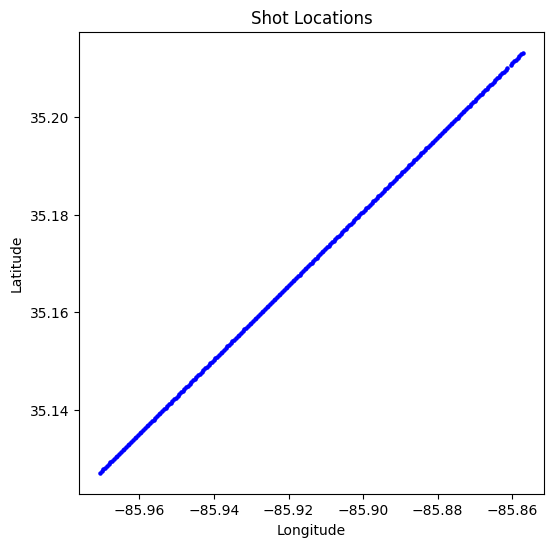

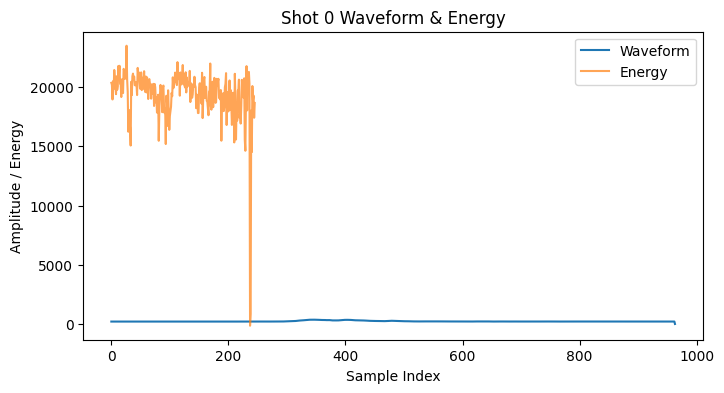

First 5 shot numbers: [24260500200098456 24260500200098457 24260500200098458 24260500200098459
 24260500200098460]
First 5 elevations: [590.97158278 593.62127249 588.71799861 589.10667091 581.56138256]


In [47]:
import numpy as np
import os
import matplotlib.pyplot as plt

# Base directory containing subfolders BEAM0101, BEAM0110, etc.
npy_base_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B'

# Recursively find all .npy files
npy_files = []
for root, dirs, files in os.walk(npy_base_dir):
    for f in files:
        if f.endswith('.npy'):
            npy_files.append(os.path.join(root, f))

print(f"Found {len(npy_files)} .npy files.")
if len(npy_files) == 0:
    raise FileNotFoundError("No .npy files found. Check folder paths.")

# Load an example file
example_file = npy_files[0]
data = np.load(example_file, allow_pickle=True).item()
print(f"Loaded file: {example_file}")
print("Variables in this file:", list(data.keys()))

# -------------------------------
# Quick Visualization
# -------------------------------

# 1️⃣ Plot shot locations
lat = data['latitude_bin0']
lon = data['longitude_bin0']

plt.figure(figsize=(6,6))
plt.scatter(lon, lat, s=5, c='blue')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Shot Locations')
plt.show()

# 2️⃣ Plot waveform and energy of the first shot
shot_idx = 0  # pick a shot
waveform = data['rxwaveform'][shot_idx]
energy = data['rx_energy'][shot_idx]

plt.figure(figsize=(8,4))
plt.plot(waveform, label='Waveform')
plt.plot(energy, label='Energy', alpha=0.7)
plt.xlabel('Sample Index')
plt.ylabel('Amplitude / Energy')
plt.title(f'Shot {shot_idx} Waveform & Energy')
plt.legend()
plt.show()

# 3️⃣ Inspect some scalar variables
print("First 5 shot numbers:", data['shot_number'][:5])
print("First 5 elevations:", data['elevation_bin0'][:5])


In [48]:
import numpy as np
import os

# Path to your specific .npy file
npy_file = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/BEAM0101/120517815_GEDI01_B_2019337015939_O05514_03_T01887_02_005_01_V002_subsetted_BEAM0101_full.npy'

# Load the .npy file (it's a dictionary)
data = np.load(npy_file, allow_pickle=True).item()

# Print the keys (variables) stored in this file
print("Variables included in this .npy file:")
for key in data.keys():
    print("-", key)

# Optionally, inspect the first few values of some variables
print("\nExample values:")

# Latitude and Longitude
print("Latitude (first 5):", data['latitude_bin0'][:5])
print("Longitude (first 5):", data['longitude_bin0'][:5])

# Shot numbers
print("Shot numbers (first 5):", data['shot_number'][:5])

# Waveform and energy of first shot
print("Waveform length of first shot:", len(data['rxwaveform'][0]))
print("Energy length of first shot:", len(data['rx_energy'][0]))


Variables included in this .npy file:
- latitude_bin0
- longitude_bin0
- shot_number
- degrade
- stale_return_flag
- elevation_bin0
- rxwaveform
- rx_energy
- rx_sample_count
- rx_sample_start_index
- solar_elevation
- digital_elevation_model

Example values:
Latitude (first 5): [35.2356212  35.23527225 35.23492587 35.23457425 35.23422667]
Longitude (first 5): [-85.92042195 -85.91995969 -85.91950007 -85.91903545 -85.91857494]
Shot numbers (first 5): [55140500300414679 55140500300414680 55140500300414681 55140500300414682
 55140500300414683]
Waveform length of first shot: 1125
Energy length of first shot: 136


Merge all npy

In [49]:
import numpy as np
import os

# ----------------------------
# Paths
# ----------------------------
base_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B'
output_file = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/GEDI_L1B_Merged_NPY.npy'

beam_subfolders = ['BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011']

# ----------------------------
# Initialize merged dictionary
# ----------------------------
merged_data = {}

# ----------------------------
# Loop through beams and files
# ----------------------------
for beam in beam_subfolders:
    beam_dir = os.path.join(base_dir, beam)
    if not os.path.exists(beam_dir):
        print(f"⚠️ Subfolder {beam} not found, skipping.")
        continue

    npy_files = [os.path.join(beam_dir, f) for f in os.listdir(beam_dir) if f.endswith('.npy')]

    for npy_file in npy_files:
        print(f"Loading {npy_file}")
        data = np.load(npy_file, allow_pickle=True).item()  # each file is a dict

        for key, val in data.items():
            if key not in merged_data:
                merged_data[key] = []  # initialize list for this variable

            # Append each variable's data
            if isinstance(val, list):  # waveform/energy are lists
                merged_data[key].extend(val)
            else:  # scalar arrays
                merged_data[key].extend(val.tolist())

# Convert scalar lists back to numpy arrays for consistency
for key in merged_data:
    if key not in ['rxwaveform', 'rx_energy']:  # keep waveform/energy as list of arrays
        merged_data[key] = np.array(merged_data[key])

# ----------------------------
# Save merged .npy
# ----------------------------
np.save(output_file, merged_data)
print(f"\n✅ Merged .npy saved as {output_file}")
print("Variables in merged file:", list(merged_data.keys()))


Loading /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/BEAM0101/120514935_GEDI01_B_2019138014405_O02426_02_T03841_02_005_01_V002_subsetted_BEAM0101_full.npy
Loading /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/BEAM0101/120514936_GEDI01_B_2019209043943_O03530_03_T03157_02_005_01_V002_subsetted_BEAM0101_full.npy
Loading /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/BEAM0101/120514937_GEDI01_B_2019210205202_O03556_02_T00995_02_005_01_V002_subsetted_BEAM0101_full.npy
Loading /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/BEAM0101/120517814_GEDI01_B_2019312044317_O05128_02_T02571_02_005_01_V002_subsetted_BEAM0101_full.npy
Loading /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/BEAM0101/120517815_GEDI01_B_2019337015939_O05514_03_T01887_02_005_01_V00

Variables in merged file: ['latitude_bin0', 'longitude_bin0', 'shot_number', 'degrade', 'stale_return_flag', 'elevation_bin0', 'rxwaveform', 'rx_energy', 'rx_sample_count', 'rx_sample_start_index', 'solar_elevation', 'digital_elevation_model']


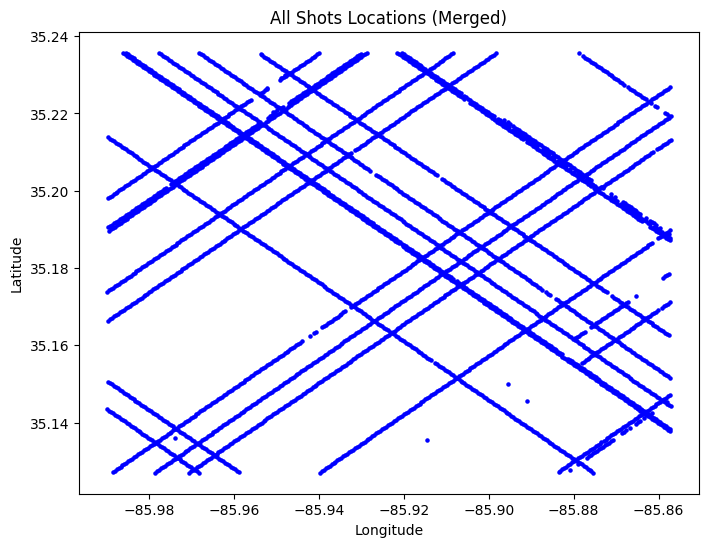

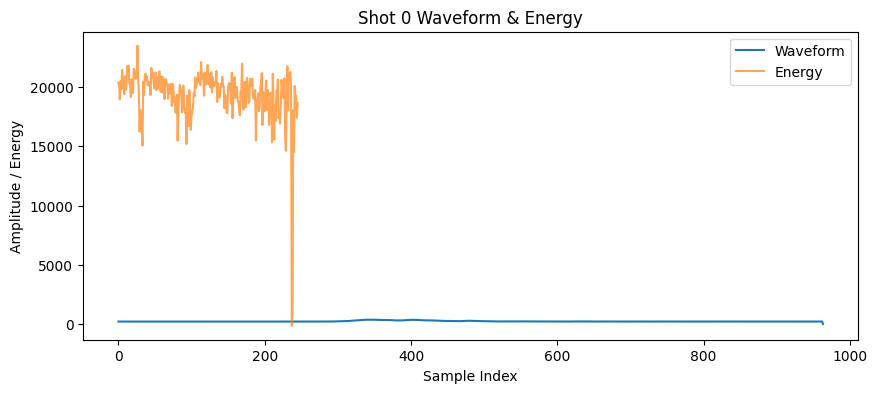

Shot 0: lat=35.12706893757398, lon=-85.97056227768552, waveform length=964, energy length=246
Shot 1: lat=35.127417594552114, lon=-85.97010075145046, waveform length=917, energy length=0
Shot 2: lat=35.12776822674682, lon=-85.96963748788569, waveform length=938, energy length=0
Shot 3: lat=35.12811742539541, lon=-85.96917547964082, waveform length=929, energy length=0
Shot 4: lat=35.12846870617677, lon=-85.96871166075083, waveform length=942, energy length=0


In [51]:
import numpy as np
import matplotlib.pyplot as plt

# Path to merged .npy
merged_file = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/GEDI_L1B_Merged_NPY.npy'

# Load merged data
data = np.load(merged_file, allow_pickle=True).item()
print("Variables in merged file:", list(data.keys()))

# -------------------------------
# 1️⃣ Plot all shot locations
# -------------------------------
lat = data['latitude_bin0']
lon = data['longitude_bin0']

plt.figure(figsize=(8,6))
plt.scatter(lon, lat, s=5, c='blue')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('All Shots Locations (Merged)')
plt.show()

# -------------------------------
# 2️⃣ Quick waveform & energy plot for a single shot
# -------------------------------
shot_idx = 0  # change this to see different shots
waveform = data['rxwaveform'][shot_idx]
energy = data['rx_energy'][shot_idx]

plt.figure(figsize=(10,4))
plt.plot(waveform, label='Waveform')
plt.plot(energy, label='Energy', alpha=0.7)
plt.xlabel('Sample Index')
plt.ylabel('Amplitude / Energy')
plt.title(f'Shot {shot_idx} Waveform & Energy')
plt.legend()
plt.show()

# -------------------------------
# 3️⃣ Iterate through first few shots
# -------------------------------
for i in range(5):
    print(f"Shot {i}: lat={lat[i]}, lon={lon[i]}, waveform length={len(data['rxwaveform'][i])}, energy length={len(data['rx_energy'][i])}")


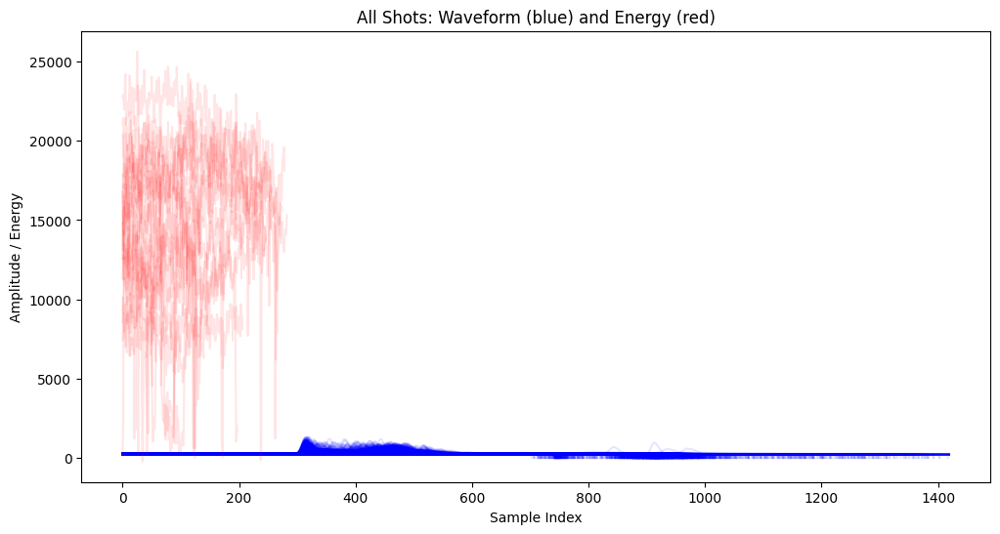

In [53]:
import numpy as np
import matplotlib.pyplot as plt

# Load merged .npy
merged_file = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/GEDI_L1B_Merged_NPY.npy'
data = np.load(merged_file, allow_pickle=True).item()

waveforms = data['rxwaveform']
energies = data['rx_energy']

# -------------------------------
# Plot all waveforms and energies
# -------------------------------
plt.figure(figsize=(12,6))

# Overlay all waveforms (transparent for better visualization)
for wf in waveforms:
    plt.plot(wf, color='blue', alpha=0.1)

# Overlay all energy curves
for en in energies:
    plt.plot(en, color='red', alpha=0.1)

plt.xlabel('Sample Index')
plt.ylabel('Amplitude / Energy')
plt.title('All Shots: Waveform (blue) and Energy (red)')
plt.show()


In [54]:
import numpy as np
import pandas as pd

# ----------------------------
# Load merged .npy
# ----------------------------
merged_file = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/GEDI_L1B_Merged_NPY.npy'
data = np.load(merged_file, allow_pickle=True).item()
print("Variables in merged file:", list(data.keys()))

# ----------------------------
# Initialize summary dictionary
# ----------------------------
summary_dict = {}

# ----------------------------
# Summarize scalar variables
# ----------------------------
for key, val in data.items():
    if key not in ['rxwaveform', 'rx_energy']:
        arr = np.array(val)
        summary_dict[key] = {
            'count': len(arr),
            'nans': np.isnan(arr).sum() if np.issubdtype(arr.dtype, np.number) else 0,
            'mean': np.nanmean(arr) if np.issubdtype(arr.dtype, np.number) else np.nan,
            'min': np.nanmin(arr) if np.issubdtype(arr.dtype, np.number) else np.nan,
            'max': np.nanmax(arr) if np.issubdtype(arr.dtype, np.number) else np.nan,
            'std': np.nanstd(arr) if np.issubdtype(arr.dtype, np.number) else np.nan
        }

# ----------------------------
# Summarize waveform and energy
# ----------------------------
for key in ['rxwaveform', 'rx_energy']:
    all_values = []
    for arr in data[key]:
        if arr is not None and len(arr) > 0:
            all_values.extend(arr)
    arr = np.array(all_values)
    summary_dict[key] = {
        'count': len(arr),
        'nans': np.isnan(arr).sum(),
        'mean': np.nanmean(arr),
        'min': np.nanmin(arr),
        'max': np.nanmax(arr),
        'std': np.nanstd(arr)
    }

# ----------------------------
# Convert to DataFrame and display
# ----------------------------
summary_df = pd.DataFrame(summary_dict).T  # transpose to get variables as rows

pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', '{:.3f}'.format)
display(summary_df)


Variables in merged file: ['latitude_bin0', 'longitude_bin0', 'shot_number', 'degrade', 'stale_return_flag', 'elevation_bin0', 'rxwaveform', 'rx_energy', 'rx_sample_count', 'rx_sample_start_index', 'solar_elevation', 'digital_elevation_model']


,count,nans,mean,min,max,std
latitude_bin0,3846.000,0.000,35.186,35.127,35.236,0.030
longitude_bin0,3846.000,0.000,-85.921,-85.990,-85.857,0.038
shot_number,3846.000,0.000,166035302045816960.000,21861100300205696.000,331701100300207168.000,110245187076756816.000
degrade,3846.000,0.000,8.220,0.000,80.000,19.577
stale_return_flag,3846.000,0.000,0.000,0.000,0.000,0.000
elevation_bin0,3846.000,0.000,649.530,313.663,5889.326,364.599
rx_sample_count,3846.000,0.000,937.651,703.000,1420.000,113.765
rx_sample_start_index,3846.000,0.000,149565.841,1.000,401861.000,101792.622
solar_elevation,3846.000,0.000,-7.866,-71.299,68.973,33.433
digital_elevation_model,3846.000,0.000,495.873,265.064,591.453,89.784


In [56]:
import numpy as np
import folium
from folium.plugins import MarkerCluster
from IPython.display import display
import matplotlib.cm as cm
import matplotlib.colors as colors

# --- Path to merged .npy ---
merged_file = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/GEDI_L1B_Merged_NPY.npy'

# --- Load merged data ---
data = np.load(merged_file, allow_pickle=True).item()

# --- Extract variables ---
lat = data['latitude_bin0']
lon = data['longitude_bin0']
shots = data['shot_number']
waveforms = data['rxwaveform']
energies = data['rx_energy']
beam = data.get('beam', ['N/A'] * len(lat))  # optional, if beam info exists

# --- Compute waveform/energy summaries per shot safely ---
def safe_stats(arr):
    if arr is None or len(arr) == 0:
        return np.nan, np.nan
    return np.nanmean(arr), np.nanmax(arr)

waveform_mean, waveform_max = zip(*[safe_stats(wf) for wf in waveforms])
energy_mean, energy_max       = zip(*[safe_stats(en) for en in energies])

# --- Create map ---
m = folium.Map(location=[np.nanmean(lat), np.nanmean(lon)], zoom_start=12, tiles='CartoDB positron')
marker_cluster = MarkerCluster().add_to(m)

# Normalize colors by waveform_max
cmap = cm.viridis
norm = colors.Normalize(vmin=np.nanmin(waveform_max), vmax=np.nanmax(waveform_max))

for i in range(len(lat)):
    if np.isnan(lat[i]) or np.isnan(lon[i]):
        continue  # skip invalid coordinates
    color = colors.rgb2hex(cmap(norm(waveform_max[i])))
    popup_html = (
        f"Waveform mean: {waveform_mean[i]:.2f}<br>"
        f"Waveform max: {waveform_max[i]:.2f}<br>"
        f"Energy mean: {energy_mean[i]:.2f}<br>"
        f"Energy max: {energy_max[i]:.2f}<br>"
        f"Beam: {beam[i]}<br>"
        f"Shot: {shots[i]}"
    )
    folium.CircleMarker(
        location=[lat[i], lon[i]],
        radius=3,
        color=color,
        fill=True,
        fill_opacity=0.7,
        popup=popup_html
    ).add_to(marker_cluster)

display(m)


/tmp/ipython-input-953342602.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


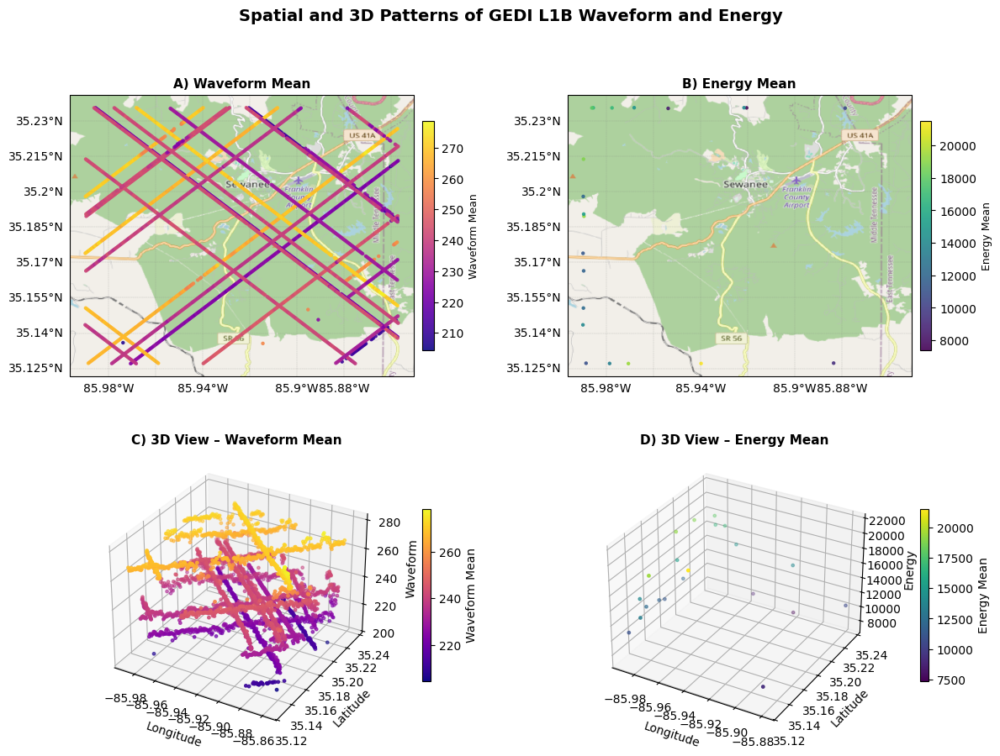

✅ Figure saved as 'GEDI_Waveform_Energy_Panels.png' (600 DPI, publication-ready)


In [57]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors as mcolors

# --- Load merged GEDI L1B .npy ---
merged_file = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/GEDI_L1B_Merged_NPY.npy'
data = np.load(merged_file, allow_pickle=True).item()

lat = np.array(data['latitude_bin0'])
lon = np.array(data['longitude_bin0'])
waveforms = data['rxwaveform']
energies = data['rx_energy']

# --- Compute per-shot summary stats ---
def safe_stats(arr):
    if arr is None or len(arr) == 0:
        return np.nan
    return np.nanmean(arr)

waveform_mean = np.array([safe_stats(wf) for wf in waveforms])
energy_mean   = np.array([safe_stats(en) for en in energies])

# --- Setup Figure ---
fig = plt.figure(figsize=(14, 10))
gs = fig.add_gridspec(2, 2, wspace=0.2, hspace=0.25)
proj = ccrs.PlateCarree()
osm_tiles = cimgt.OSM()

# --------------------------------------------------------------------
# PANEL A – Waveform Map
# --------------------------------------------------------------------
ax1 = fig.add_subplot(gs[0, 0], projection=proj)
ax1.set_title('A) Waveform Mean', fontsize=11, weight='bold')
ax1.add_image(osm_tiles, 12)
sc1 = ax1.scatter(lon, lat, c=waveform_mean, cmap='plasma', s=10,
                  transform=proj, edgecolor='none', alpha=0.9)
gl1 = ax1.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.5, linestyle='--')
gl1.top_labels = False
gl1.right_labels = False
cb1 = fig.colorbar(sc1, ax=ax1, orientation='vertical', shrink=0.8, pad=0.02)
cb1.set_label('Waveform Mean', fontsize=9)

# --------------------------------------------------------------------
# PANEL B – Energy Map
# --------------------------------------------------------------------
ax2 = fig.add_subplot(gs[0, 1], projection=proj)
ax2.set_title('B) Energy Mean', fontsize=11, weight='bold')
ax2.add_image(osm_tiles, 12)
sc2 = ax2.scatter(lon, lat, c=energy_mean, cmap='viridis', s=10,
                  transform=proj, edgecolor='none', alpha=0.9)
gl2 = ax2.gridlines(draw_labels=True, linewidth=0.3, color='gray', alpha=0.5, linestyle='--')
gl2.top_labels = False
gl2.right_labels = False
cb2 = fig.colorbar(sc2, ax=ax2, orientation='vertical', shrink=0.8, pad=0.02)
cb2.set_label('Energy Mean', fontsize=9)

# --------------------------------------------------------------------
# PANEL C – Waveform 3D Scatter
# --------------------------------------------------------------------
ax3 = fig.add_subplot(gs[1, 0], projection='3d')
sc3 = ax3.scatter(lon, lat, waveform_mean, c=waveform_mean, cmap='plasma', s=6)
ax3.set_title('C) 3D View – Waveform Mean', fontsize=11, weight='bold')
ax3.set_xlabel('Longitude')
ax3.set_ylabel('Latitude')
ax3.set_zlabel('Waveform')
cbar3 = plt.colorbar(sc3, ax=ax3, shrink=0.6, pad=0.1)
cbar3.set_label('Waveform Mean')

# --------------------------------------------------------------------
# PANEL D – Energy 3D Scatter
# --------------------------------------------------------------------
ax4 = fig.add_subplot(gs[1, 1], projection='3d')
sc4 = ax4.scatter(lon, lat, energy_mean, c=energy_mean, cmap='viridis', s=6)
ax4.set_title('D) 3D View – Energy Mean', fontsize=11, weight='bold')
ax4.set_xlabel('Longitude')
ax4.set_ylabel('Latitude')
ax4.set_zlabel('Energy')
cbar4 = plt.colorbar(sc4, ax=ax4, shrink=0.6, pad=0.1)
cbar4.set_label('Energy Mean')

# === Final Formatting ===
plt.suptitle('Spatial and 3D Patterns of GEDI L1B Waveform and Energy', fontsize=14, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# === Save High-Resolution Output ===
plt.savefig('/content/GEDI_Waveform_Energy_Panels.png', dpi=600, bbox_inches='tight')
plt.show()

print("✅ Figure saved as 'GEDI_Waveform_Energy_Panels.png' (600 DPI, publication-ready)")


/tmp/ipython-input-446334084.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


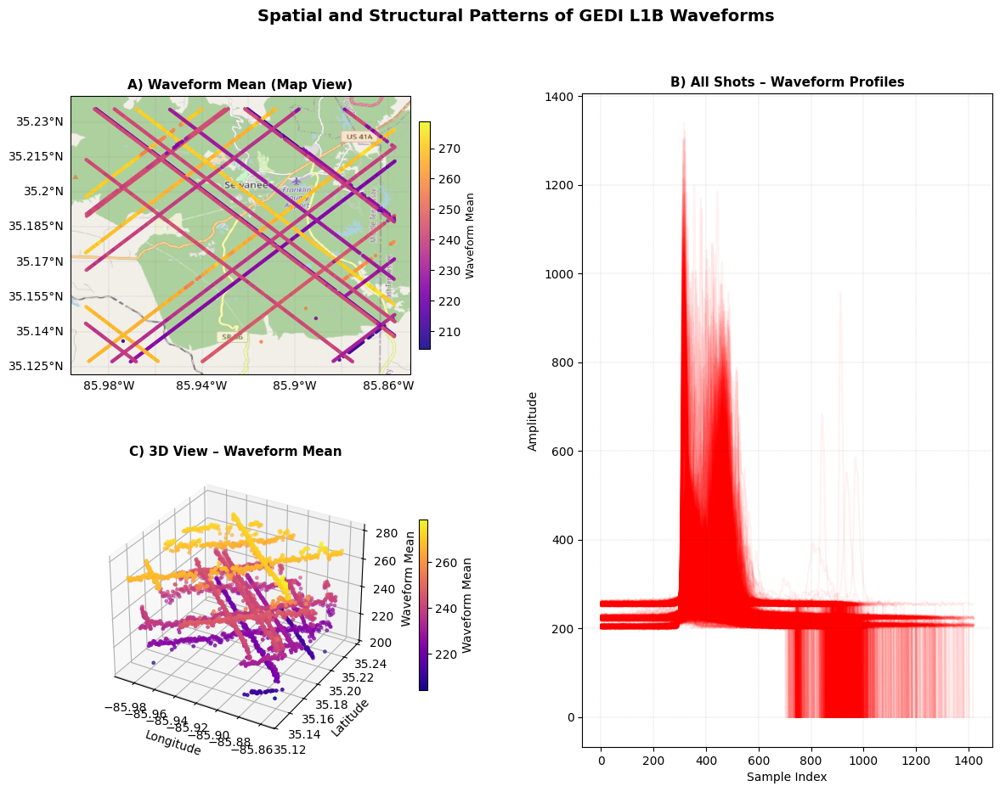

✅ Figure saved as 'GEDI_Waveform_Panels.png' (600 DPI, publication-ready)


In [60]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.colors as mcolors

# === Load merged GEDI L1B .npy ===
merged_file = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/GEDI_L1B_Merged_NPY.npy'
data = np.load(merged_file, allow_pickle=True).item()

lat = np.array(data['latitude_bin0'])
lon = np.array(data['longitude_bin0'])
waveforms = data['rxwaveform']

# === Compute per-shot waveform mean safely ===
def safe_mean(arr):
    if arr is None or len(arr) == 0:
        return np.nan
    return np.nanmean(arr)

waveform_mean = np.array([safe_mean(wf) for wf in waveforms])

# === Setup Figure (3 panels: A, C, D) ===
fig = plt.figure(figsize=(14, 10))
gs = fig.add_gridspec(2, 2, wspace=0.25, hspace=0.3)
proj = ccrs.PlateCarree()
osm_tiles = cimgt.OSM()

# --------------------------------------------------------------------
# PANEL A – Waveform Mean Map
# --------------------------------------------------------------------
ax1 = fig.add_subplot(gs[0, 0], projection=proj)
ax1.set_title('A) Waveform Mean (Map View)', fontsize=11, weight='bold')
ax1.add_image(osm_tiles, 12)
sc1 = ax1.scatter(lon, lat, c=waveform_mean, cmap='plasma', s=10,
                  transform=proj, edgecolor='none', alpha=0.9)
gl1 = ax1.gridlines(draw_labels=True, linewidth=0.3, color='gray',
                    alpha=0.5, linestyle='--')
gl1.top_labels = False
gl1.right_labels = False
cb1 = fig.colorbar(sc1, ax=ax1, orientation='vertical', shrink=0.8, pad=0.02)
cb1.set_label('Waveform Mean', fontsize=9)

# --------------------------------------------------------------------
# PANEL C – Waveform Mean 3D Scatter
# --------------------------------------------------------------------
ax2 = fig.add_subplot(gs[1, 0], projection='3d')
sc2 = ax2.scatter(lon, lat, waveform_mean, c=waveform_mean,
                  cmap='plasma', s=6)
ax2.set_title('C) 3D View – Waveform Mean', fontsize=11, weight='bold')
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')
ax2.set_zlabel('Waveform Mean')
cbar2 = plt.colorbar(sc2, ax=ax2, shrink=0.6, pad=0.1)
cbar2.set_label('Waveform Mean')

# --------------------------------------------------------------------
# PANEL D (re-purposed) – All Waveforms Overlay
# --------------------------------------------------------------------
ax3 = fig.add_subplot(gs[:, 1])  # use full right column
for wf in waveforms:
    if wf is not None and len(wf) > 0:
        ax3.plot(wf, color='red', alpha=0.05)
ax3.set_title('B) All Shots – Waveform Profiles', fontsize=11, weight='bold')
ax3.set_xlabel('Sample Index')
ax3.set_ylabel('Amplitude')
ax3.grid(True, linestyle='--', linewidth=0.3, alpha=0.7)

# === Final Formatting ===
plt.suptitle('Spatial and Structural Patterns of GEDI L1B Waveforms',
             fontsize=14, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# === Save High-Resolution Output ===
plt.savefig('/content/GEDI_Waveform_Panels.png', dpi=600, bbox_inches='tight')
plt.show()

print("✅ Figure saved as 'GEDI_Waveform_Panels.png' (600 DPI, publication-ready)")


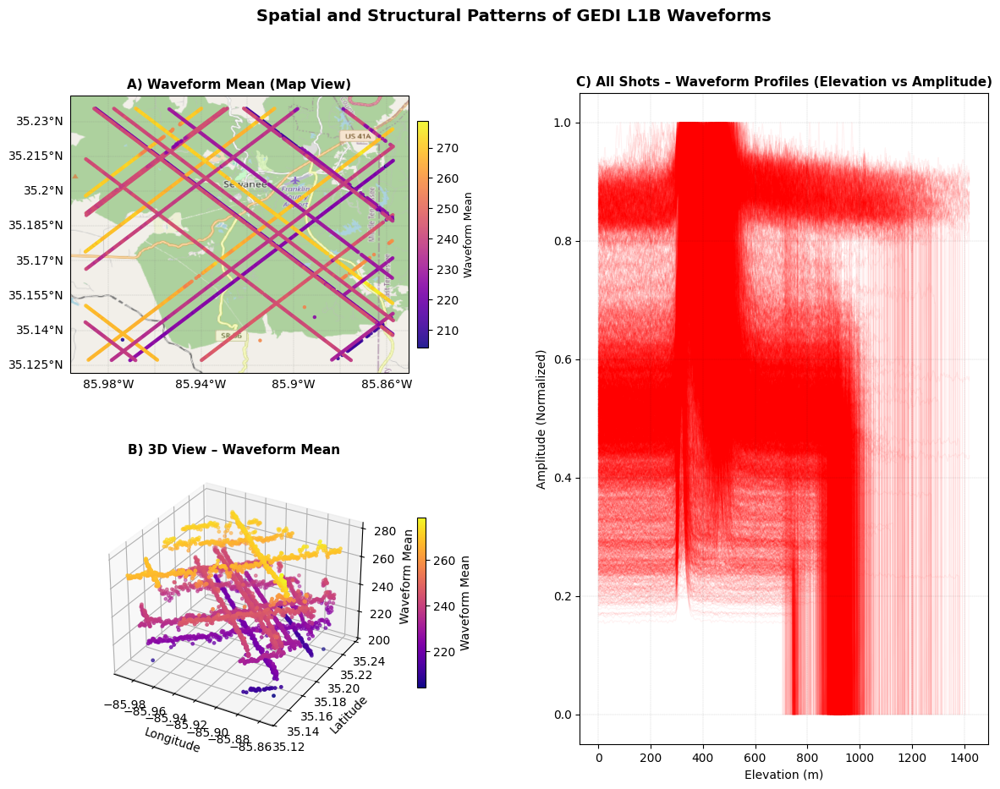

✅ Figure saved as 'GEDI_Waveform_Panels_Elevation_vs_Amplitude.png' (600 DPI, publication-ready)


In [65]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.io.img_tiles as cimgt
from mpl_toolkits.mplot3d import Axes3D
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

# === Load merged GEDI L1B .npy ===
merged_file = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/GEDI_L1B_Merged_NPY.npy'
data = np.load(merged_file, allow_pickle=True).item()

lat = np.array(data['latitude_bin0'])
lon = np.array(data['longitude_bin0'])
waveforms = data['rxwaveform']

# Optional elevation fields if available
elev_low = data.get('elev_lowestmode', None)
elev_high = data.get('elev_highestreturn', None)

# === Compute per-shot waveform mean safely ===
def safe_mean(arr):
    if arr is None or len(arr) == 0:
        return np.nan
    return np.nanmean(arr)

waveform_mean = np.array([safe_mean(wf) for wf in waveforms])

# === Setup Figure (3 panels: A, C, D) ===
fig = plt.figure(figsize=(14, 10))
gs = fig.add_gridspec(2, 2, wspace=0.25, hspace=0.3)
proj = ccrs.PlateCarree()
osm_tiles = cimgt.OSM()

# --------------------------------------------------------------------
# PANEL A – Waveform Mean Map
# --------------------------------------------------------------------
ax1 = fig.add_subplot(gs[0, 0], projection=proj)
ax1.set_title('A) Waveform Mean (Map View)', fontsize=11, weight='bold')
ax1.add_image(osm_tiles, 12)
sc1 = ax1.scatter(lon, lat, c=waveform_mean, cmap='plasma', s=10,
                  transform=proj, edgecolor='none', alpha=0.9)
gl1 = ax1.gridlines(draw_labels=True, linewidth=0.3, color='gray',
                    alpha=0.5, linestyle='--')
gl1.top_labels = False
gl1.right_labels = False
cb1 = fig.colorbar(sc1, ax=ax1, orientation='vertical', shrink=0.8, pad=0.02)
cb1.set_label('Waveform Mean', fontsize=9)

# --------------------------------------------------------------------
# PANEL C – Waveform Mean 3D Scatter
# --------------------------------------------------------------------
ax2 = fig.add_subplot(gs[1, 0], projection='3d')
sc2 = ax2.scatter(lon, lat, waveform_mean, c=waveform_mean,
                  cmap='plasma', s=6)
ax2.set_title('B) 3D View – Waveform Mean', fontsize=11, weight='bold')
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')
ax2.set_zlabel('Waveform Mean')
cbar2 = plt.colorbar(sc2, ax=ax2, shrink=0.6, pad=0.1)
cbar2.set_label('Waveform Mean')

# --------------------------------------------------------------------
# PANEL D (re-purposed) – All Waveforms: Elevation (x) vs Amplitude (y)
# --------------------------------------------------------------------
ax3 = fig.add_subplot(gs[:, 1])  # full right column
ax3.set_title('C) All Shots – Waveform Profiles (Elevation vs Amplitude)',
              fontsize=11, weight='bold')
ax3.set_xlabel('Elevation (m)')
ax3.set_ylabel('Amplitude (Normalized)')

# --- Plot each waveform horizontally ---
for i, wf in enumerate(waveforms):
    if wf is None or len(wf) == 0:
        continue

    # Normalized amplitude
    wf_norm = wf / np.nanmax(wf) if np.nanmax(wf) > 0 else wf

    # Define elevation axis
    if elev_low is not None and elev_high is not None:
        elev = np.linspace(elev_low[i], elev_high[i], len(wf_norm))
    else:
        elev = np.linspace(0, len(wf_norm), len(wf_norm))

    # Plot horizontally (x = elevation, y = amplitude)
    ax3.plot(elev, wf_norm, color='red', alpha=0.05, linewidth=0.8)

ax3.grid(True, linestyle='--', linewidth=0.3, alpha=0.7)
ax3.set_xlim(np.nanmin(elev_low) if elev_low is not None else None,
             np.nanmax(elev_high) if elev_high is not None else None)

# === Final Formatting ===
plt.suptitle('Spatial and Structural Patterns of GEDI L1B Waveforms',
             fontsize=14, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# === Save High-Resolution Output ===
plt.savefig('/content/GEDI_Waveform_Panels_Elevation_vs_Amplitude.png',
            dpi=600, bbox_inches='tight')
plt.show()

print("✅ Figure saved as 'GEDI_Waveform_Panels_Elevation_vs_Amplitude.png' (600 DPI, publication-ready)")


In [68]:
import os
import h5py
import pandas as pd

# Root where your BEAM subfolders live
data_dir = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target'

beam_groups = ['BEAM0101', 'BEAM0110', 'BEAM1000', 'BEAM1011']

# Helper: given an open beam group, try to find a latitude-like dataset to count shots
def find_lat_dataset_len(beam_group):
    """
    Look for common latitude dataset names under the beam group and return length if found.
    Returns integer length, or None if none found.
    """
    # Common explicit candidates
    candidates = [
        'geolocation/lat_lowestmode',
        'geolocation/latitude_bin0',
        'geolocation/latitude',
        'geolocation/lat_lowestmode',
        'geolocation/lat_highestreturn',
        'geolocation/lat_lowestmode'
    ]
    # Check the explicit candidates first (they may include the full path)
    for c in candidates:
        try:
            d = beam_group[c]
            # if dataset exists, return its length
            return len(d)
        except Exception:
            pass

    # Next, try to find a geolocation group then search within it
    try:
        if 'geolocation' in beam_group:
            geo = beam_group['geolocation']
            for key in geo.keys():
                if ('lat' in key.lower()) or ('latitude' in key.lower()):
                    try:
                        return len(geo[key])
                    except Exception:
                        continue
    except Exception:
        pass

    # As a last resort, scan the beam_group top-level items and return length of the first dataset
    try:
        for name in beam_group.keys():
            try:
                ds = beam_group[name]
                # If it's a dataset (not a group), attempt to get len
                # h5py returns Group or Dataset; Dataset supports len()
                if hasattr(ds, 'shape'):
                    # treat scalar as 1, else return length along first axis
                    try:
                        return len(ds)
                    except Exception:
                        continue
            except Exception:
                continue
    except Exception:
        pass

    return None  # could not determine

# Collect per-file per-beam counts
rows = []

print("🔍 Scanning recursively for .h5 files that contain '_GEDI01_B_' in the filename...\n")

file_counter = 0
for root, _, files in os.walk(data_dir):
    for fname in files:
        if not fname.endswith('.h5'):
            continue
        if "_GEDI01_B_" not in fname:
            continue  # only process files matching the required pattern

        file_counter += 1
        file_path = os.path.join(root, fname)

        try:
            with h5py.File(file_path, 'r') as f:
                # For each beam, check if present and count shots using the helper
                for beam in beam_groups:
                    if beam in f:
                        beam_group = f[beam]
                        count = find_lat_dataset_len(beam_group)
                        # If count is None, set to 0 to indicate missing/unknown
                        if count is None:
                            count = 0
                        rows.append({
                            'file_path': file_path,
                            'file_name': fname,
                            'beam': beam,
                            'shots': int(count)
                        })
                    else:
                        # beam not present -> zero shots for that beam in this file
                        rows.append({
                            'file_path': file_path,
                            'file_name': fname,
                            'beam': beam,
                            'shots': 0
                        })
        except Exception as e:
            # If file can't be opened, record as -1 shots (error)
            rows.append({
                'file_path': file_path,
                'file_name': fname,
                'beam': 'FILE_ERROR',
                'shots': -1
            })
            print(f"⚠️ Failed to open {file_path}: {e}")

# Build DataFrame
df_counts = pd.DataFrame(rows)

# Pivot to have one row per file and columns per beam
pivot = df_counts.pivot_table(index=['file_path', 'file_name'],
                              columns='beam',
                              values='shots',
                              aggfunc='first').reset_index()

# Compute totals
pivot['total_shots_in_file'] = pivot[[b for b in beam_groups if b in pivot.columns]].sum(axis=1)

beam_totals = {b: int(pivot[b].sum()) if b in pivot.columns else 0 for b in beam_groups}
grand_total = int(pivot['total_shots_in_file'].sum())

# Print results
print(f"Files matching pattern and scanned: {file_counter}\n")
print("Per-file counts (first 20 rows):")
display(pivot.head(20))

print("\n--- Beam totals across all scanned files ---")
for b in beam_groups:
    print(f"{b}: {beam_totals.get(b, 0):,} shots")
print(f"\nGRAND TOTAL (all beams, all files): {grand_total:,} shots")

# Optionally, save to CSV for inspection
out_csv = os.path.join(data_dir, 'GEDI_L1B_per_file_shot_counts.csv')
pivot.to_csv(out_csv, index=False)
print(f"\nSaved per-file summary CSV to: {out_csv}")


🔍 Scanning recursively for .h5 files that contain '_GEDI01_B_' in the filename...

Files matching pattern and scanned: 32

Per-file counts (first 20 rows):


beam,file_path,file_name,BEAM0101,BEAM0110,BEAM1000,BEAM1011,total_shots_in_file
0,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,120514935_GEDI01_B_2019138014405_O02426_02_T03...,247,0,0,0,247
1,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,120514936_GEDI01_B_2019209043943_O03530_03_T03...,276,0,0,0,276
2,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,120514937_GEDI01_B_2019210205202_O03556_02_T00...,279,0,0,0,279
3,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,120517814_GEDI01_B_2019312044317_O05128_02_T02...,53,0,0,0,53
4,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,120517815_GEDI01_B_2019337015939_O05514_03_T01...,137,0,0,0,137
5,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,120520016_GEDI01_B_2022289120454_O21768_02_T09...,0,0,148,0,148
6,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,120520018_GEDI01_B_2022352181058_O22749_03_T07...,0,0,68,0,68
7,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,120520019_GEDI01_B_2022358084911_O22836_02_T06...,0,0,284,0,284
8,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,120520020_GEDI01_B_2023023204458_O23309_02_T08...,0,0,178,0,178
9,/content/drive/MyDrive/PhD_Main_Folder/Geo_Dat...,120521191_GEDI01_B_2024169103448_O31228_02_T05...,0,0,109,0,109



--- Beam totals across all scanned files ---
BEAM0101: 992 shots
BEAM0110: 0 shots
BEAM1000: 1,150 shots
BEAM1011: 3,348 shots

GRAND TOTAL (all beams, all files): 5,490 shots

Saved per-file summary CSV to: /content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/GEDI_L1B_per_file_shot_counts.csv


In [69]:
import numpy as np

# Path to merged GEDI L1B .npy
merged_npy_path = '/content/drive/MyDrive/PhD_Main_Folder/Geo_Data/Sewanee_DL_Project/GEDI_target/npy_full_GEDIL1B/GEDI_L1B_Merged_NPY.npy'

# Load the merged file
data = np.load(merged_npy_path, allow_pickle=True).item()

# Determine the number of shots
# (Most GEDI merged dicts have per-shot arrays like 'rxwaveform', 'latitude_bin0', etc.)
if 'rxwaveform' in data:
    num_shots = len(data['rxwaveform'])
else:
    # fallback: pick any key with an array of matching length
    lengths = {k: len(v) for k, v in data.items() if isinstance(v, (list, np.ndarray))}
    num_shots = max(lengths.values()) if lengths else 0

print(f"📊 Total GEDI shots in merged NPY: {num_shots:,}")


📊 Total GEDI shots in merged NPY: 3,846
